In [1]:
import os
os.chdir("../")
print(os.getcwd())

/home/pg221/Desktop/PhD_Projects/Mori-Zwanzig-Autoencoder


In [2]:
import torch, pickle
from torch.utils.data import Dataset, DataLoader
from src.PreProc_Data.DataProc import StackedSequenceDataset
import numpy as np
from src.Eval_MZA import Eval_MZA
import matplotlib.pyplot as plt
import pandas as pd


In [3]:
torch.cuda.empty_cache()
exp_dir   = "Trained_Models/2DCyl_Num_seqlentest_ts10_2_localtest"  #Experiment Directory
exp_name  = "sl3_nhu40_numobs2_bs16_lr5e-5_3"                #One of the experiment names

eval_mza = Eval_MZA(exp_dir, exp_name)
print(eval_mza.deactivate_seqmodel)

False


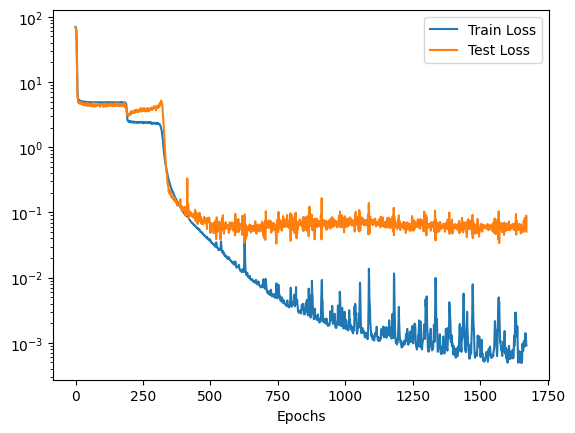

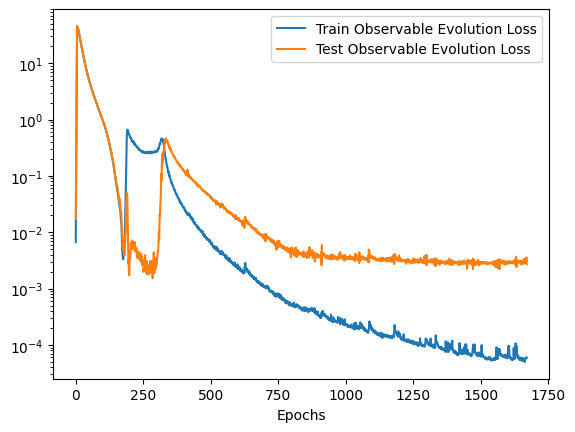

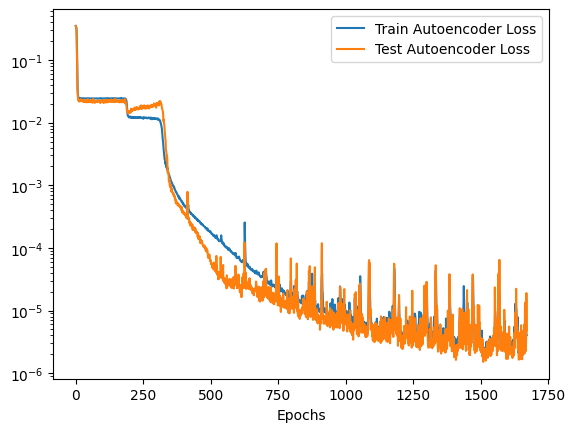

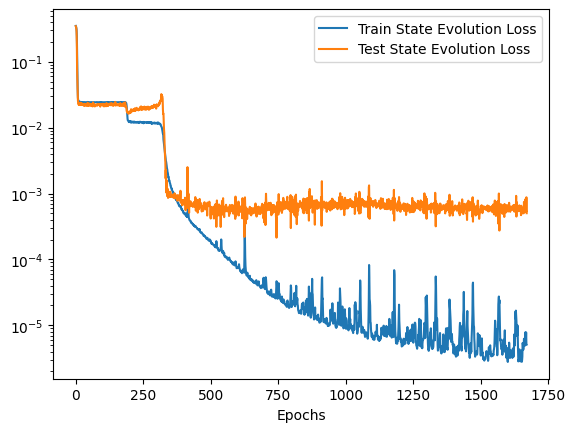

In [4]:
#plot learning curves
eval_mza.plot_learning_curves()

In [5]:
epoch_num = 1500
eval_mza.load_weights(epoch_num)

In [6]:
#One Step Prediction

# eval_mza.train_size = 0.9
eval_mza.load_and_preproc_data()
eval_mza.create_dataset(mode = "Train")
dataset = eval_mza.train_dataset
num_trajs = eval_mza.train_num_trajs

if not eval_mza.deactivate_seqmodel:
    x_nn_hat, Phi_nn_hat, x_nn, Phi_nn, State_MSE, koop_out, seqmodel_out = eval_mza.predict_onestep(dataset, num_trajs)

else:
    x_nn_hat, Phi_nn_hat, x_nn, Phi_nn, State_MSE = eval_mza.predict_onestep(dataset, num_trajs)
    
print(x_nn_hat.shape, Phi_nn_hat.shape, Phi_nn.shape)

#Plotting one step prediction
x_nn_hat.shape, x_nn.shape


Data Shape:  (1, 201, 10108)
Not normalizing Input
Train_Shape:  (1, 198, 10108)
out of train
torch.Size([1, 198, 2]) torch.Size([1, 198, 10108]) torch.Size([1, 198, 10108])


/home/pg221/anaconda3/envs/KS/lib/python3.10/site-packages/torch/nn/modules/rnn.py:774: UserWarning: RNN module weights are not part of single contiguous chunk of memory. This means they need to be compacted at every call, possibly greatly increasing memory usage. To compact weights again call flatten_parameters(). (Triggered internally at /opt/conda/conda-bld/pytorch_1670525552843/work/aten/src/ATen/native/cudnn/RNN.cpp:968.)
  result = _VF.lstm(input, hx, self._flat_weights, self.bias, self.num_layers,


(torch.Size([1, 198, 2]), torch.Size([1, 198, 2]))

In [7]:
#Load Data
with open('Data/2DCylinder/cyl_data_10_2.pkl', 'rb') as f:
    data_dict = pickle.load(f)


In [8]:
sub_X = data_dict["sub_X"]
sub_Y = data_dict["sub_Y"]
U_nn = Phi_nn_hat[...,:int(Phi_nn_hat.shape[-1]/2)].detach().cpu().numpy()
V_nn = Phi_nn_hat[...,int(Phi_nn_hat.shape[-1]/2):].detach().cpu().numpy()
U = Phi_nn[...,:int(Phi_nn.shape[-1]/2)].detach().cpu().numpy()
V = Phi_nn[...,int(Phi_nn.shape[-1]/2):].detach().cpu().numpy()

U_nn.shape, V_nn.shape, U.shape, V.shape



((1, 198, 5054), (1, 198, 5054), (1, 198, 5054), (1, 198, 5054))

In [9]:
def energy(u,v):
    k = 0.5*(np.mean(u**2,axis=-1) + np.mean(v**2,axis=-1))
    return k

k_pred = energy(U_nn,V_nn)
k = energy(U, V)

(1, 198)


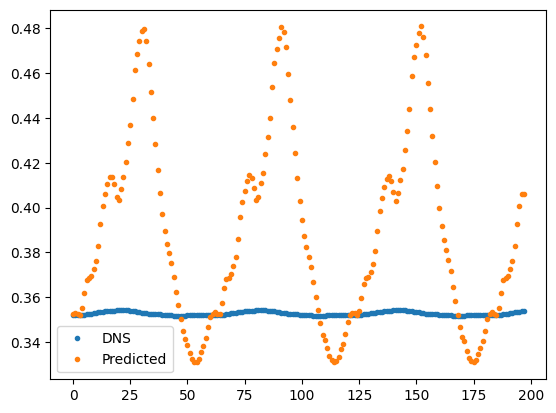

In [10]:
print(k.shape)
plt.plot(k[0,:], ".", label = "DNS")
plt.plot(k_pred[0,:], ".", label = "Predicted")
plt.legend()

/tmp/ipykernel_9082/479716379.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


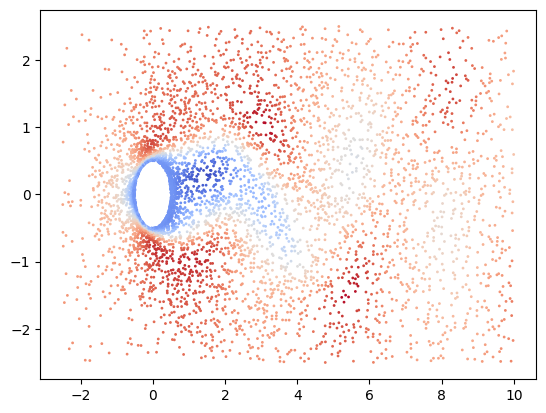

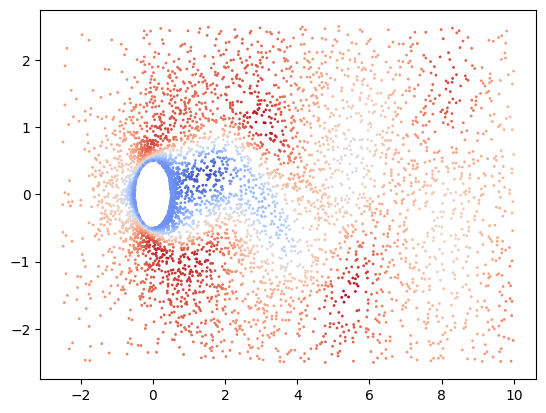

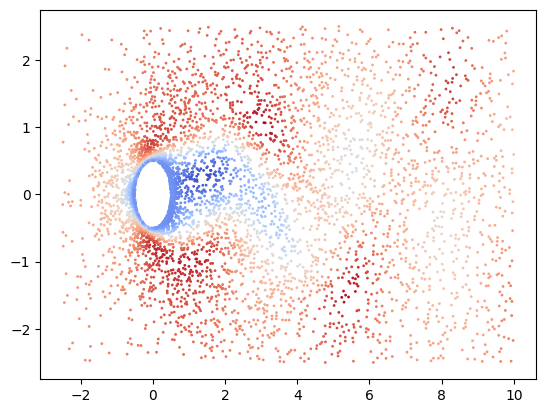

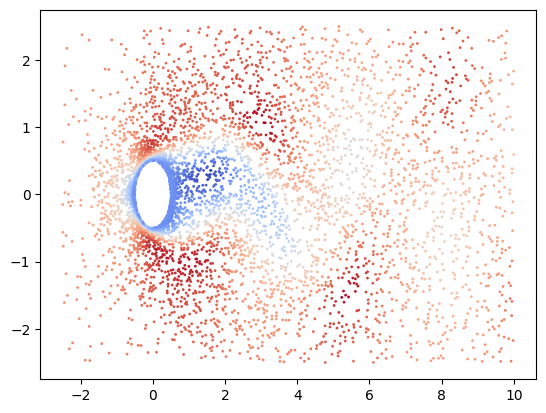

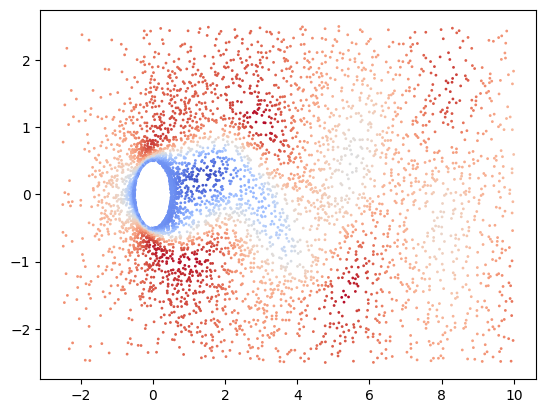

...

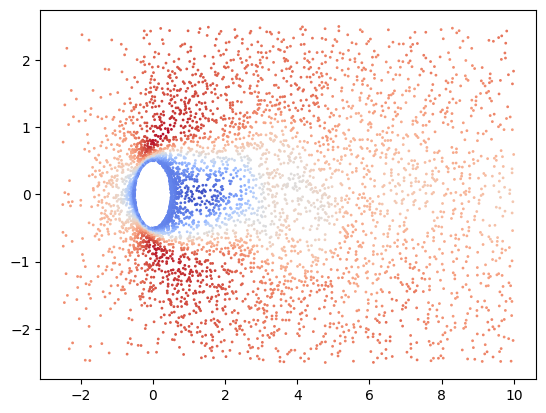

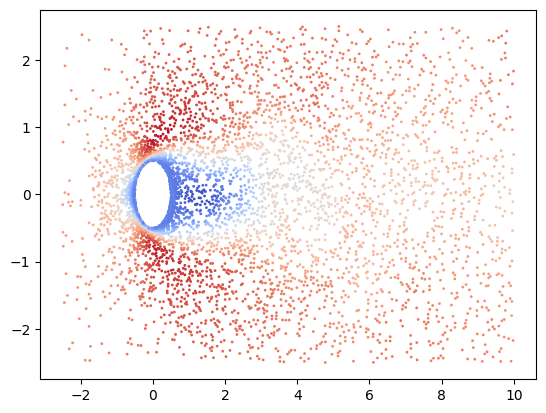

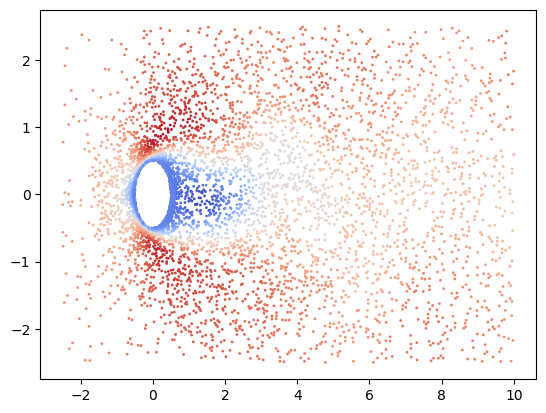

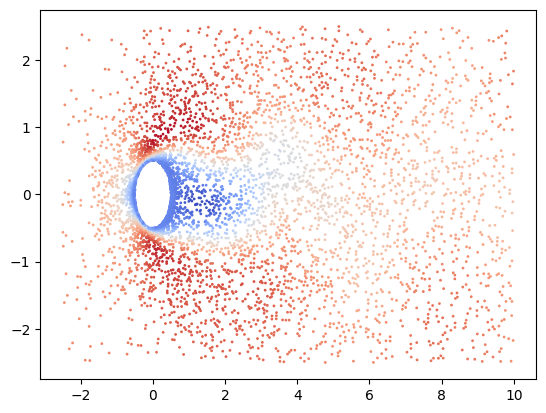

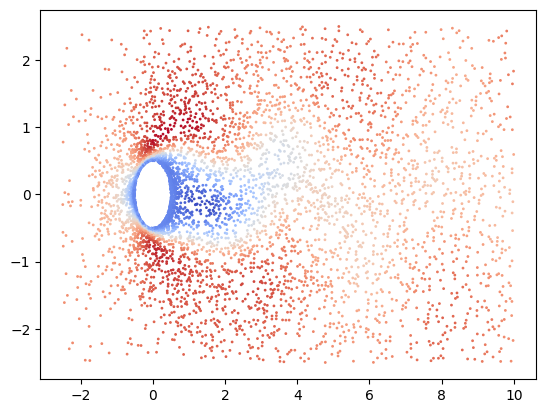

In [11]:
for i in range(100,180):
    plt.figure()
    plt.scatter(sub_X,sub_Y,c=U_nn[0,i], s=1, cmap = 'coolwarm')

In [ ]:
for i in range (1):
    plt.figure()
    plt.plot(Phi_nn_hat.cpu().numpy()[i,:,0], label = "Predicted")
    plt.plot(Phi_nn.cpu().numpy()[i,:,0], label = "DNS")
    plt.legend()

plt.ylabel("u0")
plt.xlabel("Timesteps")
plt.figure()
plt.semilogy(State_MSE.cpu().numpy())
plt.xlabel("Timesteps")
plt.ylabel("MSE")
plt.legend()

In [ ]:
for i in range (1):
    plt.figure()
    plt.plot(koop_out.cpu().numpy()[i,:,1], label = "Koopman Predicted")
    plt.plot(seqmodel_out.cpu().numpy()[i,:,1], label = "Seqmodel Predicted")
    plt.plot(Phi_nn_hat.cpu().numpy()[i,:,1], label = "DNS")
    plt.legend()

plt.figure()
plt.semilogy(State_MSE.cpu().numpy())
plt.xlabel("Timesteps")
plt.ylabel("MSE")
plt.legend()

In [14]:
#defining moving average
def moving_avg(u):

    pdu  = pd.DataFrame(u)
    u_ma = pdu.expanding().mean()
    return u_ma

# print(u_ma.shape)

# plt.plot(np.arange(u.shape[1]),u[...,0].squeeze(), label = "Mean Energy")
# plt.plot(u_ma)
# # plt.plot(np.arange(ref_X.shape[0]),ref_X_ma, linewidth = 3, label = "Time Moving Average")
# plt.xlabel("Time Units")
# plt.ylabel("Mean Energy")
# plt.legend()

In [ ]:
Phi_nn_hat_ma = moving_avg(Phi_nn_hat.cpu().numpy())

plt.plot(Phi_nn_hat_ma)

In [12]:
#multistep prediction
timesteps = 150
initial_conditions = Phi_nn[:,0,:].to(eval_mza.device)
print(initial_conditions.shape)
x_ms_hat, Phi_ms_hat = eval_mza.predict_multistep(initial_conditions, timesteps)
U_ms_nn = Phi_ms_hat[...,:int(Phi_ms_hat.shape[-1]/2)].detach().cpu().numpy()
V_ms_nn = Phi_ms_hat[...,int(Phi_ms_hat.shape[-1]/2):].detach().cpu().numpy()
print(x_ms_hat.shape, Phi_ms_hat.shape)


torch.Size([1, 10108])
torch.Size([1, 151, 2]) torch.Size([1, 151, 10108])


(1, 198)


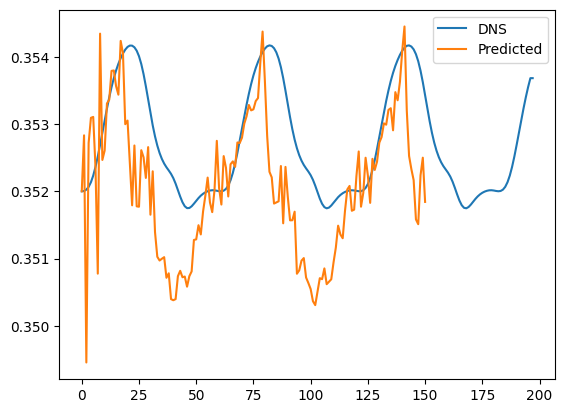

In [13]:
k_ms_pred = energy(U_ms_nn,V_ms_nn)
k = energy(U, V)

print(k.shape)
plt.plot(k[0,:], label = "DNS")
plt.plot(k_ms_pred[0,:], label = "Predicted")
plt.legend()

(151,)


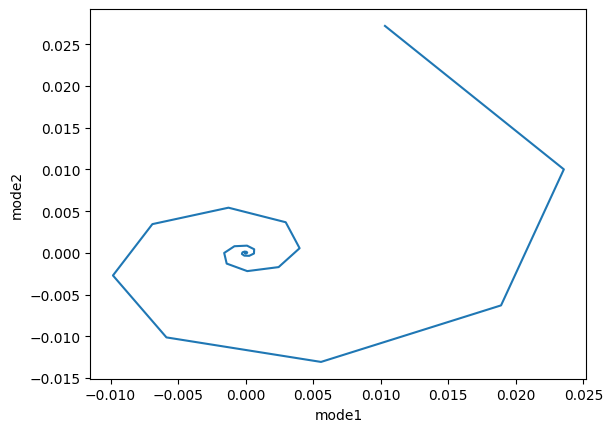

In [13]:
#2D Plots

data = x_ms_hat.detach().cpu().numpy()
print(data[0,:,0].shape)
plt.plot(data[0,:,0],data[0,:,1])

plt.xlabel("mode1")
plt.ylabel("mode2")
# fig = plt.figure()
# ax = fig.add_subplot(projection='3d')
# ax.scatter(data[0,:,0],data[0,:,1], data[0,:,2])

plt.show()



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Generate sample data
data = x_ms_hat.detach().cpu().numpy()  # Replace with your actual data array

# Get x, y, and z coordinates
x = np.arange(data.shape[1])
y = np.arange(data.shape[2])
X, Y = np.meshgrid(x, y)
Z = data[0, :, :]

# Create 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z)

# Set axis labels
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Show the plot
plt.show()

In [38]:
eval_mza.deactivate_seqmodel

False

In [39]:
# for i in range (1):
#     plt.figure()
#     plt.plot(Phi_nn.cpu().numpy()[i,:timesteps,0], '-', label = "Target")
#     plt.plot(Phi_hat.cpu().numpy()[i,:,0], '-', label = "Predicted")
#     plt.legend()



In [ ]:
for i in range(0,30):
    plt.figure()
    # plt.scatter(sub_X,sub_Y,c=U_ms_nn[0,i], s=1, cmap = 'coolwarm')
    plt.tricontourf(sub_X,sub_Y,U_ms_nn[0,i], s=1, cmap = 'coolwarm')

(1, 151, 2)
tensor(0.0780, device='cuda:0') tensor(0.0664, device='cuda:0')


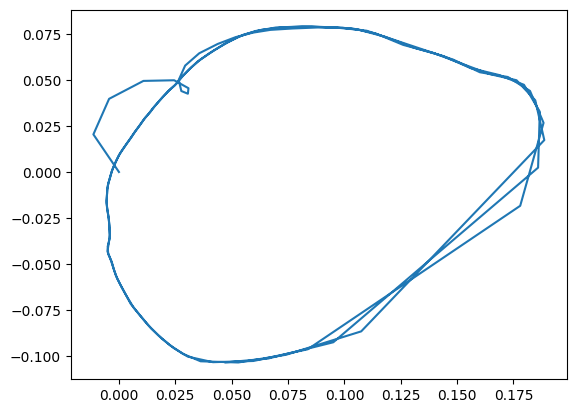

In [16]:
#Calculating residuals

residuals = (x_nn[:,:timesteps+1] - x_ms_hat).detach().cpu().numpy()
print(residuals.shape)

plt.plot(residuals[0,:,0], residuals[0,:,1])
print(x_nn[0,-1,1], x_nn[0,-1,0])

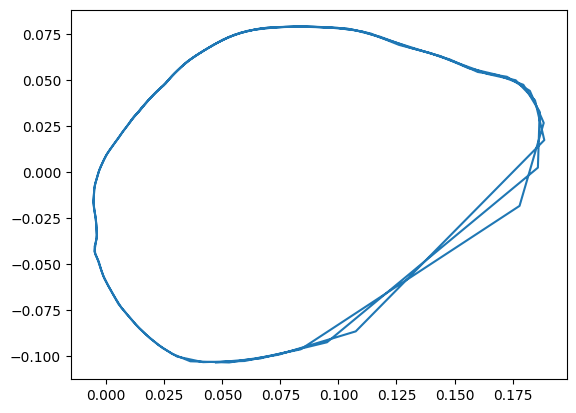

In [20]:
plt.plot(x_nn[0,:timesteps+1,0].detach().cpu().numpy(), x_nn[0,:timesteps+1,1].detach().cpu().numpy())

torch.Size([1, 198, 10108]) torch.Size([1, 61, 10108])


Text(0, 0.5, 'MSE')

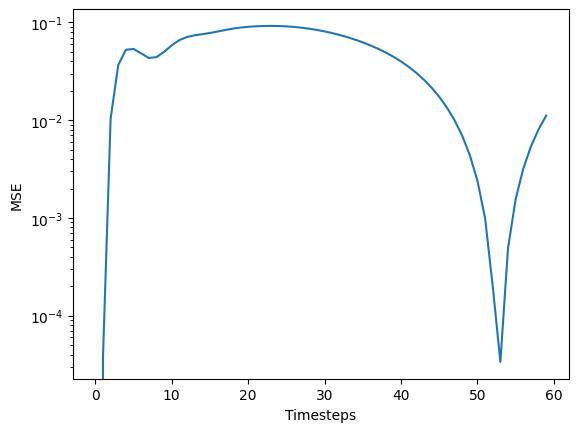

In [20]:
#Calculating MSE of the predictions
print(Phi_nn.shape, Phi_ms_hat.shape)
State_MSE_multistep = Eval_MZA.state_mse(Phi_nn[:,:timesteps],Phi_ms_hat[:,:timesteps])
plt.figure()
plt.semilogy(State_MSE_multistep.detach().cpu().numpy())
plt.xlabel("Timesteps")
plt.ylabel("MSE")

# np.save("koopman_numobs32.npy",Phi_hat.cpu().numpy())

In [12]:
import numpy
k1 = np.load("koopman_numobs4.npy")
k2 = np.load("koopman_numobs16.npy")
k3 = np.load("koopman_numobs32.npy")
k1.shape

plt.figure()
# plt.plot(k1[:,0])
plt.plot(np.linspace(0,101,1001),k2[0,:,1], label = "Koopman")
plt.plot(np.linspace(0,101,1001),Phi_nn[0,:1001,1].cpu().numpy(), label = "Target")
plt.plot(np.linspace(0,101,1001),Phi_hat.cpu().numpy()[0,:,1], label = "MZA Memory = 0.4 timeunits")
# plt.plot(k3[:,0])
plt.legend()
plt.xlabel("Timeunits")
plt.ylabel("u1")
k2.shape

FileNotFoundError: [Errno 2] No such file or directory: 'koopman_numobs4.npy'

<Figure size 640x480 with 0 Axes>

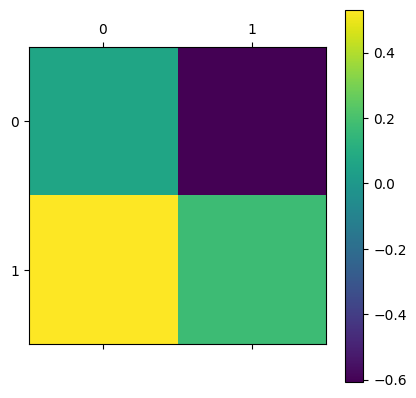

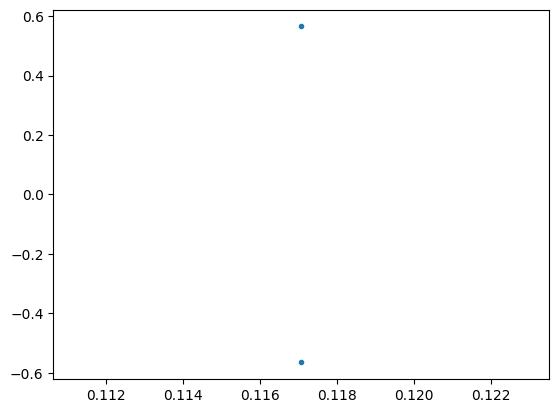

: 

In [24]:
mat = eval_mza.model.koopman.getKoopmanMatrix()
mat = mat.detach().cpu().numpy()
w, v = np.linalg.eig(mat)

idx = w.argsort()[::-1]
w = w[idx]
v = v[:,idx]

plt.figure()
plt.matshow(mat)
plt.colorbar()

plt.figure()
plt.plot(np.real(w), np.imag(w), ".")

In [50]:
print(v)

[[-0.6590989 +0.j         -0.6590989 -0.j         -0.5611127 +0.j
  -0.59986955+0.j         -0.59986955-0.j          0.0579122 +0.j
   0.10275634-0.21027166j  0.10275634+0.21027166j]
 [ 0.42595643+0.01296251j  0.42595643-0.01296251j  0.5531422 +0.j
  -0.21137244+0.12355813j -0.21137244-0.12355813j  0.61332333+0.j
  -0.01225696-0.02723885j -0.01225696+0.02723885j]
 [-0.15814564+0.06498217j -0.15814564-0.06498217j -0.39416677+0.j
  -0.11507002+0.08877631j -0.11507002-0.08877631j -0.09138632+0.j
   0.27734515+0.40742597j  0.27734515-0.40742597j]
 [ 0.09255031+0.01660752j  0.09255031-0.01660752j -0.14891446+0.j
  -0.23403145-0.0079724j  -0.23403145+0.0079724j   0.2149291 +0.j
   0.46631488-0.09011916j  0.46631488+0.09011916j]
 [ 0.47030097+0.00724845j  0.47030097-0.00724845j  0.29196602+0.j
  -0.27438274-0.38024306j -0.27438274+0.38024306j -0.33993784+0.j
  -0.0867408 -0.21926166j -0.0867408 +0.21926166j]
 [ 0.02160783-0.0422493j   0.02160783+0.0422493j  -0.00854447+0.j
  -0.13923292+0.316

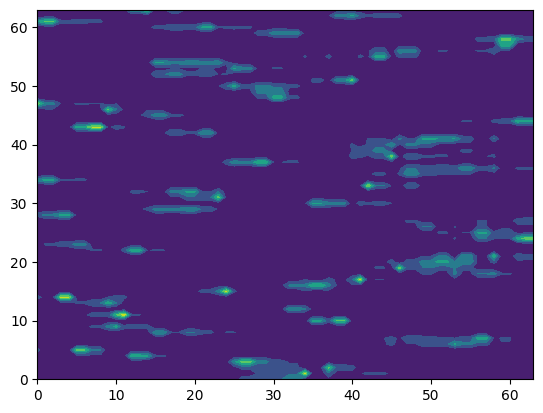

In [56]:
plt.contourf(abs(v))